# 0. Setup

Create Environment:

    python3 -m venv venv
    venv\Scripts\activate
    python3 -m pip install --upgrade pip setuptools wheel

Install required packages:

    python3 -m pip install -r requirements.txt

# 1. Data

## 1.1 Raw data inspection

In [1]:
from pathlib import Path
import scipy.io as sio
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import random
from torch.utils.data import Dataset
import torch
import numpy as np
import cv2

In [9]:
data_path = Path("data/raw/")
data_id = "165"
image_path = data_path / (data_id + ".tiff")
coord_path = data_path / (data_id + "_coords.mat")

Note: As coords collected in matlab, indexing starts with 1 and not with 0 => For inspecting the correct coords in python, indices might need a subtraction by 1.

In [10]:
# Read and process coordinate data
# Read data
coord_data = sio.loadmat(coord_path)

# Inspect available variables
print(coord_data.keys())

# Get coordinates and rectangle position
coords = np.round(coord_data["coords"]).astype(int)      # shape: (N, 2)
if len(coords) > 0:
    coords -= 1 # Indexing from matlab format to python format
    x = coords[:,0]
    y = coords[:,1]
else:
    x, y = None, None
# Get ROI
rectPos = coord_data["rectPos"]
rect_x, rect_y, rect_w, rect_h = rectPos[0]
# Account for matlab index shift
rect_x -= 1
rect_y -= 1
# Discretize ROI such that it does not shrink and Ws and Hs stay equal across ROIs
rect_x = int(max(np.floor(rect_x),0))
rect_y = int(max(np.floor(rect_y),0))
rect_w = int(np.ceil(rect_w) + 1) # +1 to make sure that flooring lower bounds is no greater shift than ceiling dimensions
rect_h = int(np.ceil(rect_h) + 1)

dict_keys(['__header__', '__version__', '__globals__', 'coords', 'rectPos'])


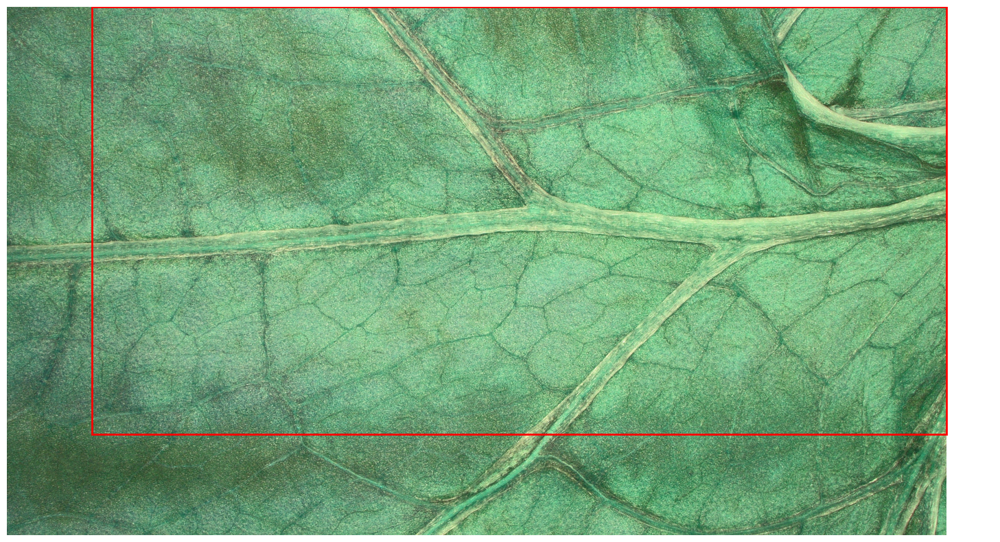

In [11]:
# Load image and plot it with coordinates
# Load image
img = cv2.imread(str(image_path))
# Plot image and coords
fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(img)
ax.scatter(x, y, s=20, c="red", marker="o")
ax.add_patch(
    Rectangle(
        (rect_x, rect_y), rect_w, rect_h,
        fill=False,
        edgecolor="red",
        linewidth=2
    )
)
plt.axis("off")
plt.show()

Only ROI inspection:

0


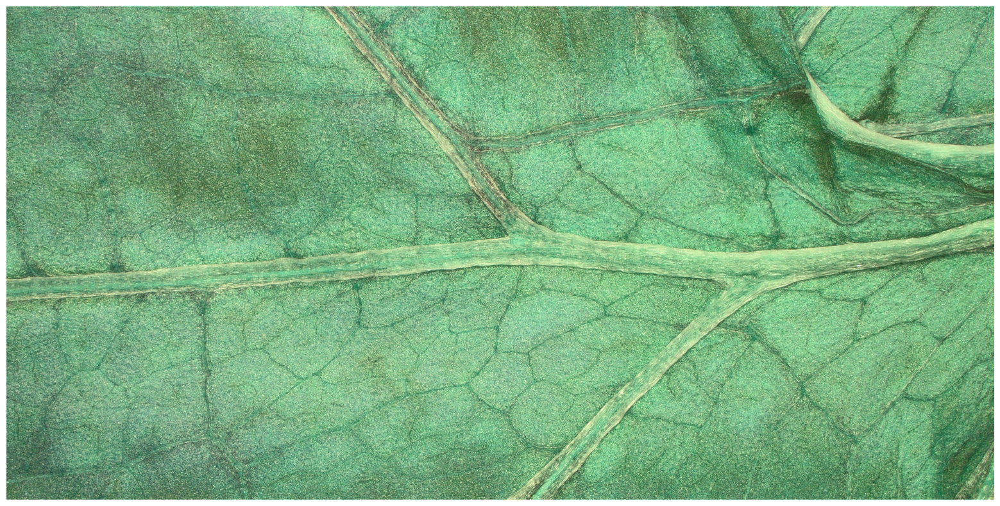

In [12]:
new_img = img[rect_y:rect_y+rect_h,rect_x:rect_x+rect_w,:]
if len(coords) > 0:
    x = coords[:,0]
    y = coords[:,1]
    x -= rect_x
    y -= rect_y
else:
    x, y = None, None
# Plot image and coords
fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(new_img)
ax.scatter(x, y, s=20, c="red", marker="o")
plt.axis("off")
plt.show()

### 1.2 Data preprocessing

In [29]:
def split_filenames(
        file_ids,
        train_ratio=0.7,
        val_ratio=0.15,
        seed=42
        ):
    """
    Split file IDs into train/val/test sets with random shuffling.

    Parameters
    ----------
    file_ids : list of str
        List of file identifier strings.
    train_ratio : float, optional
        Proportion for training set (default: 0.7).
    val_ratio : float, optional
        Proportion for validation set (default: 0.15).
    seed : int, optional
        Random seed for reproducibility (default: 42).

    Returns
    -------
    dict
        Dictionary with keys 'train', 'val', 'test' containing lists of file IDs.
    """ 
    # Random shuffle ids
    rng = random.Random(seed)
    file_ids = list(file_ids)
    rng.shuffle(file_ids)

    # Get lengths of train and val data
    n = len(file_ids)
    n_train = int(train_ratio * n)
    n_val = int(val_ratio * n)

    # Sort shuffled ids into split-categories
    file_id_splits = {
        "train": file_ids[:n_train],
        "val": file_ids[n_train:n_train+n_val],
        "test": file_ids[n_train+n_val:]
    }

    return file_id_splits


def process_single_image(
        data_path: Path,
        data_id: str
        ):
    """
    Extract ROI from image and adjust trichome coordinates to ROI bounds.

    Parameters
    ----------
    data_path : Path
        Directory containing image and coordinate files.
    data_id : str
        Base filename (without extension).

    Returns
    -------
    new_img : numpy.ndarray
        Cropped image containing only the ROI.
    coords : numpy.ndarray
        Nx2 array of adjusted trichome coordinates.
    roi_size : tuple of int
        ROI dimensions as (width, height).

    Raises
    ------
    RuntimeError
        If coordinates fall outside ROI boundaries.
    """
    # Open coordinate data
    coord_path = data_path / f"{data_id}_coords.mat"
    coord_data = sio.loadmat(coord_path)

    # Get ROI
    rectPos = coord_data["rectPos"]
    rect_x, rect_y, rect_w, rect_h = rectPos[0]
    # Account for matlab index shift
    rect_x -= 1
    rect_y -= 1
    # Discretize ROI such that it does not shrink and Ws and Hs stay equal across ROIs
    rect_x = int(max(np.floor(rect_x),0))
    rect_y = int(max(np.floor(rect_y),0))
    rect_w = int(np.ceil(rect_w) + 1) # +1 to make sure that flooring lower bounds is no greater shift than ceiling dimensions
    rect_h = int(np.ceil(rect_h) + 1)

    # Open img
    img_path = data_path / f"{data_id}.tiff"
    img = cv2.imread(str(img_path))

    # Cutout ROI
    new_img = img[rect_y:rect_y+rect_h,
                    rect_x:rect_x+rect_w,
                    :]
 
    # Get trichome coordinate vector 
    coords = coord_data["coords"].astype(np.float32)
    # If coordinates are not empty (leaf with trichomes), process them
    if len(coords > 0):
        # Shift coordinate data by matlab indexing missmatch
        coords -= 1
        # Shift coordinate data by ROI lower bounds
        coords[:,0] -= rect_x
        coords[:,1] -= rect_y

        # Check if all coordinates are within image bounds 
        if (np.any(coords[:, 0] < 0) or 
            np.any(coords[:, 0] >= rect_w) or 
            np.any(coords[:, 1] < 0) or 
            np.any(coords[:, 1] >= rect_h)):
            raise RuntimeError(
                f"File {data_id} has coordinates outside its ROI."
            )
    
    return new_img, coords, (rect_w, rect_h)


def preprocess_dataset(raw_root: Path, out_root: Path):
    """
    Process dataset by splitting files and extracting ROIs with coordinates.

    Creates train/val/test splits and saves processed images as JPEGs and 
    coordinates as .npy files. Validates ROI size consistency across dataset.

    Parameters
    ----------
    raw_root : Path
        Directory with raw TIFF images and coordinate .mat files.
    out_root : Path
        Output directory for processed data.

    Raises
    ------
    FileExistsError
        If output directories already exist.
    RuntimeError
        If ROI sizes are inconsistent.
    """  
    # Get all file ids and define splits
    file_ids = sorted(p.stem for p in raw_root.glob("*.tiff"))
    n_ids = len(file_ids)
    splits = split_filenames(file_ids)

    last_roi_size = None
    file_count = 0
    print("Progress: ", end="")

    for split, ids in splits.items():

        # Create image and point split directories
        img_out = out_root / split / "images"
        coords_out = out_root / split / "coords"

        if img_out.exists() or coords_out.exists():
            raise FileExistsError("Preprocessing paths already exist. Delete manually if preprocessing should be redone.")

        img_out.mkdir(parents=True, exist_ok=True)
        coords_out.mkdir(parents=True, exist_ok=True)

        for fid in ids:
            img, coords, roi_size = process_single_image(raw_root,fid)

            # Check for unequal ROI sizes across images
            if last_roi_size is not None and roi_size != last_roi_size:
                raise RuntimeError("Inconsistent ROI sizes detected.")
            last_roi_size = roi_size

            # Save data
            cv2.imwrite(str(img_out / f"{fid}.jpg"), img)
            np.save(coords_out / f"{fid}.npy", coords)

            # Update progress
            file_count += 1
            if(int(file_count)%int((n_ids/10)) == 0):
                print("#", end="")


In [30]:
preprocess_dataset(
    raw_root=Path("data/raw"),
    out_root=Path("data/processed"),
)

Progress: ##########

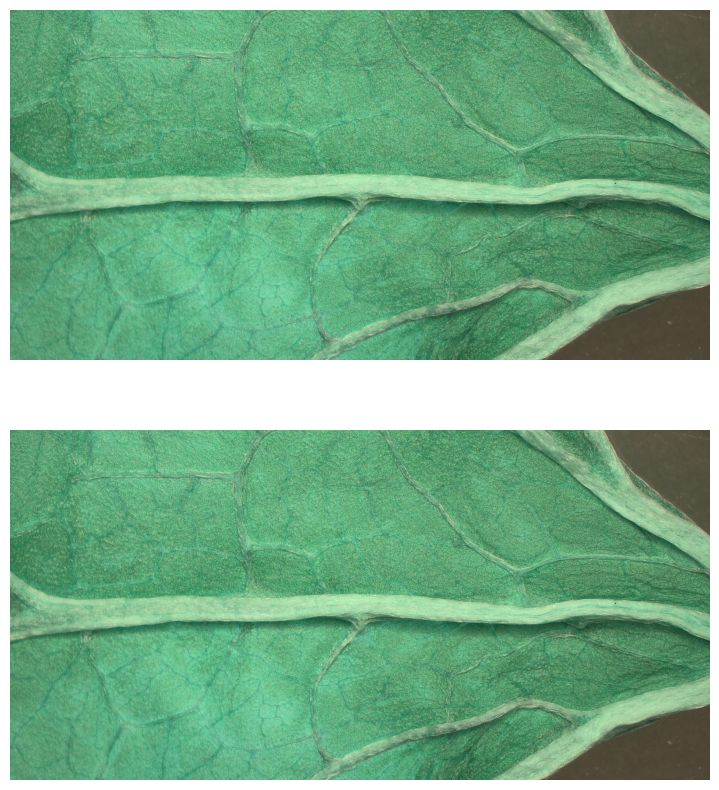

In [31]:
# Sanity check: Compare raw data to preprocessed data
def getRandomDataPaths(seed=None):
    """
    Get random file paths for raw and preprocessed image and coordinate data.

    Randomly selects a data split (train/val/test) and a file from that split,
    then returns paths to both the raw and preprocessed versions of the data.

    Parameters
    ----------
    seed : int, optional
        Random seed for reproducibility (default: None).

    Returns
    -------
    image_path_raw : Path
        Path to the raw TIFF image file.
    coord_path_raw : Path
        Path to the raw coordinate .mat file.
    image_path_pre : Path
        Path to the preprocessed JPEG image file.
    coord_path_pre : Path
        Path to the preprocessed coordinate .npy file.
    """
    # Use seed if given
    if seed is not None:
        random.seed(seed)

    # Choose processed image and coord path randomly
    data_paths = [Path("data/processed/train"),
                  Path("data/processed/val"),
                  Path("data/processed/test")]
    data_path = random.choice(data_paths) 
    img_path = data_path / "images"
    coord_path = data_path / "coords"

    # List all image ids in path and choose a id randomly
    file_ids = [p.stem for p in img_path.glob("*.jpg")]
    file_id = random.choice(file_ids)

    # Select paths to raw and processed data based on file id
    image_path_raw = Path("data/raw") / (file_id + ".tiff")
    coord_path_raw = Path("data/raw") / (file_id + "_coords.mat")
    image_path_pre = img_path / (file_id + ".jpg")
    coord_path_pre = coord_path / (file_id + ".npy")

    return image_path_raw, coord_path_raw, image_path_pre, coord_path_pre


image_path_raw, coord_path_raw, image_path_pre, coord_path_pre = getRandomDataPaths()

# Compare raw and processed image in figure
fig, ax = plt.subplots(2,1,figsize=(10,10))

# Raw image
img_raw = cv2.imread(str(image_path_raw))
coord_data_raw = sio.loadmat(coord_path_raw)
coords_raw = coord_data_raw["coords"]    # shape: (N, 2)
if len(coords_raw) > 0:
    coords_raw -= 1 # Indexing from matlab format to python format
    x = coords_raw[:,0]
    y = coords_raw[:,1]
else:
    x, y = None, None
rectPos = coord_data_raw["rectPos"]
rect_x, rect_y, rect_w, rect_h = rectPos[0]
rect_x -= 1 # Account for matlab index shift
rect_y -= 1

ax[0].imshow(img_raw)
ax[0].scatter(x, y, s=10, c="red", marker="o")
ax[0].set_xlim(rect_x,rect_x+rect_w)
ax[0].set_ylim(rect_y+rect_h, rect_y)
ax[0].axis("off")

# Processed image
img_pre = cv2.imread(str(image_path_pre))
coords_pre = np.load(coord_path_pre)
if len(coords_pre) > 0:
    x = coords_pre[:,0]
    y = coords_pre[:,1]
else:
    x, y = None, None

ax[1].imshow(img_pre)
ax[1].scatter(x, y, s=10, c="red", marker="o")
ax[1].axis("off");

### 1.3 Data transformations and density map

In [33]:
class Compose:
    """
    Compose multiple transforms together for image and coordinate data.

    Parameters
    ----------
    transforms : list
        List of transform objects to apply sequentially.

    Methods
    -------
    __call__(image, coords)
        Apply all transforms in sequence to image and coordinates.
    """
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, coords):
        """
        Apply all transforms sequentially.

        Parameters
        ----------
        image : numpy.ndarray
            Input image.
        coords : numpy.ndarray
            Nx2 array of point coordinates.

        Returns
        -------
        image : numpy.ndarray
            Transformed image.
        coords : numpy.ndarray
            Transformed point coordinates.
        """
        # Apply transforms sequentially
        for t in self.transforms:
            image, coords = t(image, coords)
        return image, coords
    

class ResizeShortSide:
    """
    Resize image and scale coordinates so the shorter side matches target length.

    Parameters
    ----------
    short_side : int
        Target length for the shorter side of the image.

    Methods
    -------
    __call__(image, coords)
        Resize image and scale point coordinates proportionally.
    """
    def __init__(self, short_side):
        self.short_side = short_side

    def __call__(self, image, coords):
        """
        Resize image and scale coordinates.

        Parameters
        ----------
        image : numpy.ndarray
            Input image.
        coords : numpy.ndarray
            Nx2 array of point coordinates.

        Returns
        -------
        image : numpy.ndarray
            Resized image.
        coords : numpy.ndarray
            Scaled point coordinates.
        """
        # Get scaling via minimal side length (short side length)
        H, W = image.shape[:2]
        scale = self.short_side / min(H, W)

        # Apply scaling to get new W and H
        new_W = round(W * scale)
        new_H = round(H * scale)

        # Resize image
        image = cv2.resize(
            image,
            (new_W, new_H),
            interpolation=cv2.INTER_LINEAR
        )

        # Scale coordinates
        coords = coords * scale

        return image, coords
    

class RandomCrop:
    """
    Randomly crop image and filter coordinates to those within the crop.

    Parameters
    ----------
    crop_w : int
        Width of the crop.
    crop_h : int
        Height of the crop.

    Methods
    -------
    __call__(image, coords)
        Randomly crop image and adjust point coordinates.

    Raises
    ------
    RuntimeError
        If crop size is larger than image dimensions.
    """
    def __init__(self, crop_w, crop_h):
        self.crop_w = crop_w
        self.crop_h = crop_h

    def __call__(self, image, coords):
        """
        Apply random crop to image and coordinates.

        Parameters
        ----------
        image : numpy.ndarray
            Input image.
        coords : numpy.ndarray
            Nx2 array of point coordinates.

        Returns
        -------
        image : numpy.ndarray
            Cropped image.
        coords : numpy.ndarray
            Point coordinates within crop bounds, adjusted to crop origin.

        Raises
        ------
        RuntimeError
            If crop size exceeds image dimensions.
        """
        H, W = image.shape[:2]

        # Check if crop size is within image size
        if W < self.crop_w or H < self.crop_h:
            raise RuntimeError("Crop size larger than image.")

        # Get random upper left corner coordinates
        x0 = random.randint(0, W - self.crop_w)
        y0 = random.randint(0, H - self.crop_h)

        # Copy image and apply crop to copy
        image = image.copy()
        image = image[y0:y0+self.crop_h,x0:x0+self.crop_w,:]

        # Update cropped image coordinates based on sampled upper left corner
        if len(coords) > 0:
            coords = coords.copy()
            coords[:, 0] -= x0
            coords[:, 1] -= y0

            # define mask to keep only coordinates inside crop
            mask = (
                (coords[:, 0] >= 0) &
                (coords[:, 0] < self.crop_w) &
                (coords[:, 1] >= 0) &
                (coords[:, 1] < self.crop_h)
            )

            return image, coords[mask]
        else:
            return image, coords
    

class RandomHorizontalFlip:
    """
    Randomly flip image and coordinates horizontally with given probability.

    Parameters
    ----------
    p : float, optional
        Probability of applying the flip (default: 0.5).

    Methods
    -------
    __call__(image, coords)
        Apply random horizontal flip to image and coordinates.
    """
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, image, coords):
        """
        Apply random horizontal flip.

        Parameters
        ----------
        image : numpy.ndarray
            Input image.
        coords : numpy.ndarray
            Nx2 array of point coordinates.

        Returns
        -------
        image : numpy.ndarray
            Flipped or original image.
        coords : numpy.ndarray
            Flipped or original point coordinates.
        """
        # By chance return data without flip
        if random.random() > self.p:
            return image, coords

        # Flip image along horizontal axis (=1)
        W = image.shape[1]
        image = cv2.flip(image, 1)

        # If coordinates exist, flip them
        if len(coords) > 0:
            coords = coords.copy()
            coords[:, 0] = W - 1 - coords[:, 0]

        return image, coords
    

class RandomVerticalFlip:
    """
    Randomly flip image and coordinates vertically with given probability.

    Parameters
    ----------
    p : float, optional
        Probability of applying the flip (default: 0.5).

    Methods
    -------
    __call__(image, coords)
        Apply random vertical flip to image and coordinates.
    """
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, image, coords):
        """
        Apply random vertical flip.

        Parameters
        ----------
        image : numpy.ndarray
            Input image.
        coords : numpy.ndarray
            Nx2 array of point coordinates.

        Returns
        -------
        image : numpy.ndarray
            Flipped or original image.
        coords : numpy.ndarray
            Flipped or original point coordinates.
        """
        # By chance return data without flip
        if random.random() > self.p:
            return image, coords
        
        # Flip image along vertical axis (=0)
        H = image.shape[0]
        image = cv2.flip(image, 0)

        # If coordinates exist, flip them
        if len(coords) > 0:
            coords = coords.copy()
            coords[:, 1] = H - 1 - coords[:, 1]

        return image, coords

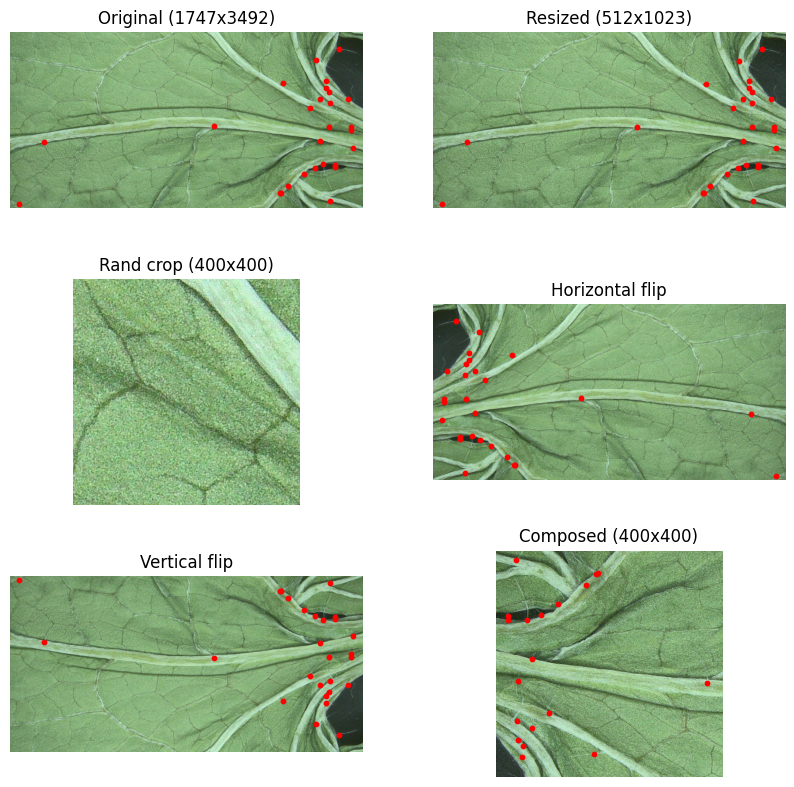

In [34]:
# Sanity check: Inspect transformation outcomes
_, _, img_path, coord_path = getRandomDataPaths()
img = cv2.imread(str(img_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
coords = np.load(coord_path)
H,W = img.shape[:2]


# Compare untransformed and transformed data
fig, axs = plt.subplots(3,2,figsize=(10,10))

# Original image
ax = axs[0,0]
ax.imshow(img)
if len(coords) > 0:
    x = coords[:,0]
    y = coords[:,1]
    ax.scatter(x, y, s=10, c="red", marker="o")
ax.axis("off")
ax.set_title(f"Original ({H}x{W})")

# Resize image
short_side = 512
scale = short_side / min(H, W)
resize = ResizeShortSide(short_side)
img_new, coords_new = resize(img, coords)
ax = axs[0,1]
ax.imshow(img_new)
if len(coords_new) > 0:
    x = coords_new[:,0]
    y = coords_new[:,1]
    ax.scatter(x, y, s=10, c="red", marker="o")
ax.axis("off")
ax.set_title(f"Resized ({round(scale*H)}x{round(scale*W)})")

# Random crop
crop_w, crop_h = 400,400
crop = RandomCrop(crop_w, crop_h)
img_new, coords_new = crop(img, coords)
ax = axs[1,0]
ax.imshow(img_new)
if len(coords_new) > 0:
    x = coords_new[:,0]
    y = coords_new[:,1]
    ax.scatter(x, y, s=10, c="red", marker="o")
ax.axis("off")
ax.set_title(f"Rand crop ({crop_h}x{crop_w})")

# Random horizontal flip (p=1 => sure flip)
flip_horiz = RandomHorizontalFlip(1)
img_new, coords_new = flip_horiz(img, coords)
ax = axs[1,1]
ax.imshow(img_new)
if len(coords_new) > 0:
    x = coords_new[:,0]
    y = coords_new[:,1]
    ax.scatter(x, y, s=10, c="red", marker="o")
ax.axis("off")
ax.set_title("Horizontal flip")

# Random vertical flip (p=1 => sure flip)
flip_vert = RandomVerticalFlip(1)
img_new, coords_new = flip_vert(img, coords)
ax = axs[2,0]
ax.imshow(img_new)
if len(coords_new) > 0:
    x = coords_new[:,0]
    y = coords_new[:,1]
    ax.scatter(x, y, s=10, c="red", marker="o")
ax.axis("off")
ax.set_title("Vertical flip")

# Composition: Resize -> Crop -> Flip horiz -> Flip vert
comp = Compose([resize, crop, flip_horiz, flip_vert])
img_new, coords_new = comp(img, coords)
ax = axs[2,1]
ax.imshow(img_new)
if len(coords_new) > 0:
    x = coords_new[:,0]
    y = coords_new[:,1]
    ax.scatter(x, y, s=10, c="red", marker="o")
ax.axis("off")
ax.set_title(f"Composed ({crop_h}x{crop_w})");

### 1.4 Create datasets und dataloaders

In [52]:
def generate_density_map(coords, H, W, sigma):
    """
    Generate a 2D Gaussian density map from point coordinates.

    Creates a density map by placing a normalized 2D Gaussian kernel at each
    coordinate location. The density map represents the spatial distribution
    of points as a continuous heatmap.

    Parameters
    ----------
    coords : torch.Tensor
        Nx2 tensor of (x, y) coordinates.
    H : int
        Height of the output density map.
    W : int
        Width of the output density map.
    sigma : float
        Standard deviation of the Gaussian kernel.

    Returns
    -------
    density : torch.Tensor
        HxW density map with accumulated Gaussian kernels.
    """
    # Initialize empty density map
    density = torch.zeros((H, W), dtype=torch.float32)

    # Return empty map if no coordinates provided
    if len(coords) == 0:
        return density

    # Create coordinate grids for entire image
    yy, xx = torch.meshgrid(
        torch.arange(H),
        torch.arange(W),
        indexing="ij"
    )

    # Add Gaussian kernel for each coordinate
    for x, y in coords:
        # Compute 2D Gaussian centered at (x, y)
        g = torch.exp(
            -((xx - x) ** 2 + (yy - y) ** 2) / (2 * sigma ** 2)
        )
        # Normalize Gaussian kernel
        g /= 2 * np.pi * sigma ** 2
        # Accumulate into density map
        density += g

    return density

In [53]:
class TrichomeDataset(Dataset):
    """
    PyTorch Dataset for trichome detection with density map targets.

    Loads images and point coordinates, applies transformations, and generates
    Gaussian density maps for training crowd counting or point detection models.

    Parameters
    ----------
    root : str or Path
        Root directory containing 'images/' and 'coords/' subdirectories.
    transform : callable, optional
        Transform to apply to images and coordinates (default: None).
    sigma : float, optional
        Standard deviation for Gaussian density map generation (default: 4.0).

    Attributes
    ----------
    images : list of Path
        Sorted list of image file paths.

    Methods
    -------
    __len__()
        Return number of samples in dataset.
    __getitem__(idx)
        Get image, density map, and coordinates for given index.
    """
    def __init__(self, root, transform=None, sigma=4.0):
        self.root = Path(root)
        self.transform = transform
        self.sigma = sigma
        self.images = sorted((self.root / "images").glob("*.jpg"))

    def __len__(self):
        """
        Return the total number of samples in the dataset.

        Returns
        -------
        int
            Number of images in the dataset.
        """
        return len(self.images)

    def __getitem__(self, idx):
        """
        Get a single sample from the dataset.

        Parameters
        ----------
        idx : int
            Index of the sample to retrieve.

        Returns
        -------
        img : numpy.ndarray
            RGB image array.
        density : torch.Tensor
            Generated density map.
        coords : torch.Tensor
            Nx2 tensor of trichome coordinates.
        """
        # Construct file paths
        img_path = self.images[idx]
        coord_path = self.root / "coords" / f"{img_path.stem}.npy"

        # Load image and convert to RGB + load coordinates
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        coords = torch.from_numpy(np.load(coord_path)).float()

        # Apply transforms if provided
        if self.transform:
            img, coords = self.transform(img, coords)

        # Generate density map from coordinates
        H, W = img.shape[:2]
        density = generate_density_map(coords, H, W, self.sigma)

        return img, density, coords

In [54]:
def visualize_image_coords(image, coords, title=""):
    """
    Visualize an image with point coordinates overlaid.

    Parameters
    ----------
    image : numpy.ndarray
        RGB image to display.
    coords : numpy.ndarray
        Nx2 array of (x, y) coordinates to plot as red scatter points.
    title : str, optional
        Title for the plot (default: "").
    """
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    if len(coords) > 0:
        plt.scatter(coords[:, 0], coords[:, 1],
                    s=10, c="red")
    plt.title(title)
    plt.axis("off")
    plt.show()

def visualize_density(image, density, alpha=0.5):
    """
    Visualize a density map overlaid on an image.

    Parameters
    ----------
    image : numpy.ndarray
        RGB image to display as background.
    density : numpy.ndarray or torch.Tensor
        2D density map to overlay using jet colormap.
    alpha : float, optional
        Transparency level for density overlay (default: 0.5).
    """
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    # Overlay density map with transparency
    plt.imshow(density, cmap="jet", alpha=alpha)
    #plt.colorbar(label="Density")
    plt.axis("off")
    plt.show()

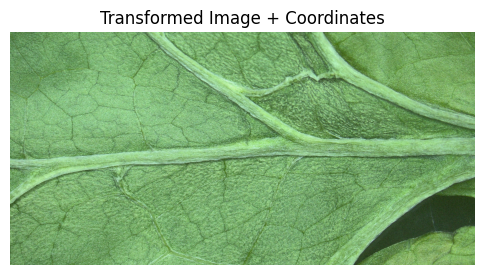

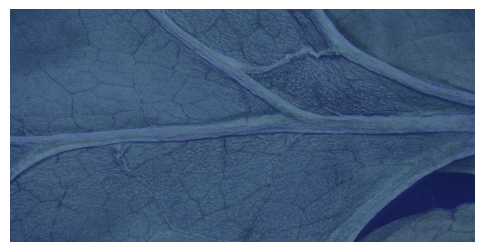

In [68]:
train_ds = TrichomeDataset(root=Path("data/processed/train"),
                           transform=ResizeShortSide(512),
                           sigma=10)

# NOTE: dependency between sigma and image size
rand_idx = np.random.randint(0,len(train_ds))
img, density, coords = train_ds[rand_idx]

visualize_image_coords(img, coords, "Transformed Image + Coordinates")
visualize_density(img, density)

In [71]:
yy, xx = torch.meshgrid(
        torch.arange(5),
        torch.arange(10),
        indexing="ij"
    )
print(yy)
print(xx)

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
        [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
        [3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
        [4, 4, 4, 4, 4, 4, 4, 4, 4, 4]])
tensor([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
        [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
        [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
        [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
        [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])
